In [1]:
from collections import OrderedDict
import re
import os

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
from tqdm.notebook import tqdm

from eval import get_run_metrics, read_run_dir, get_model_from_run
from plot_utils import basic_plot, collect_results, relevant_model_names

%matplotlib inline
%load_ext autoreload
%autoreload 2

sns.set_theme('notebook', 'darkgrid')
palette = sns.color_palette('colorblind')

run_dir = "/home/xc425/project/models"

In [2]:
df = read_run_dir(run_dir)
df  # list all the runs in our run_dir

,run_id,task,model,kwargs,num_tasks,num_examples,n_dims,n_layer,n_head,run_name
83,stackxy_model_five2embeds_noise20d_1,linear_regression,Transformer-five,,-1,-1,20,5,8,linear_regression_five2embeds_stackxy_noise20d...
7,stackxy_model_five2embeds_noise30d_1,linear_regression,Transformer-five,,-1,-1,30,5,8,linear_regression_five2embeds_stackxy_noise30d...
35,aeaf99ce-bfac-4b46-b9d9-d86edfc0c786,linear_regression,Transformer-five,,-1,-1,5,5,8,linear_regression_five_10
133,3609090c-9b6d-40eb-9d0c-b02cb7bfbfdc,linear_regression,Transformer-five,,-1,-1,10,5,8,linear_regression_five_no_pos_10d_1
19,3616936c-0ca1-4def-b561-63a242954120,linear_regression,Transformer-five,,-1,-1,15,5,8,linear_regression_five_no_pos_15d_1
...,...,...,...,...,...,...,...,...,...,...
11,fb56e506-3bc5-4e94-96ba-6e45d0259808,linear_regression,Transformer-xs,,-1,-1,5,3,2,linear_regression_tiny_try4th
141,b7e099d8-8fe4-42cc-925c-7ebf267b66ba,linear_regression,Transformer-xs,,-1,-1,5,3,2,linear_regression_tiny_try4th
128,stackxy_model_five2embeds_square5d_1,linear_regression,Transformer-five,,-1,-1,5,5,8,non_linear_square_five2embeds_stackxy_square5d...
157,stackxy_model_five_square5d_1,linear_regression,Transformer-five,,-1,-1,5,5,8,non_linear_square_five_stackxy_square5d_1000ex_1


In [5]:
task = "linear_regression"
#task = "sparse_linear_regression"
#task = "decision_tree"
#task = "relu_2nn_regression"

run_id = "stackxy_model_one-four_noise5d_dtrain_1"  # if you train more models, replace with the run_id from the table above

run_path = os.path.join(run_dir, task, run_id)
recompute_metrics = False

if recompute_metrics:
    get_run_metrics(run_path)  # these are normally precomputed at the end of training

# Plot pre-computed metrics

wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNIN

linear_regression_one-four_stackxy_noise5d_dtrain_2000ex_1 stackxy_model_one-four_noise5d_dtrain_1


wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path 

wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.


wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
100%|██████████| 15/15 [00:00<00:00, 311458.22it/s]
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.


wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory
wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory


wandb: WARNING Path ../models/linear_regression/stackxy_model_one-four_noise5d_dtrain_1/wandb/ wasn't writable, using system temp directory.


{'half_subspace': {'Transformer-one-four': {'mean': [1.051069450378418, 0.6457278251647949, 0.3970635890960693, 0.21651155948638917, 0.1308627724647522, 0.11302144527435302, 0.06601821184158325, 0.05326265096664429, 0.044405198097229, 0.03976380228996277, 0.033949756622314455, 0.030429822206497193, 0.031250199675559996, 0.028991740942001343, 0.022268351912498475, 0.0340849906206131, 0.020919974148273467, 0.020361776649951934, 0.021732358634471892, 0.021497002243995665, 0.019040699303150176, 0.01722300350666046, 0.014864133298397064, 0.020561806857585907, 0.015506123006343842, 0.018144479393959044, 0.015686051547527315, 0.01751275360584259, 0.01624765545129776, 0.015801337361335755, 0.016143709421157837, 0.015448813140392304, 0.01803094446659088, 0.015310248732566834, 0.016474562883377075, 0.016643843054771422, 0.018596428632736205, 0.014359214901924133, 0.016079065203666688, 0.01651490181684494, 0.0158539742231369, 0.015369881689548493, 0.017268505692481995, 0.015432432293891907, 0.017

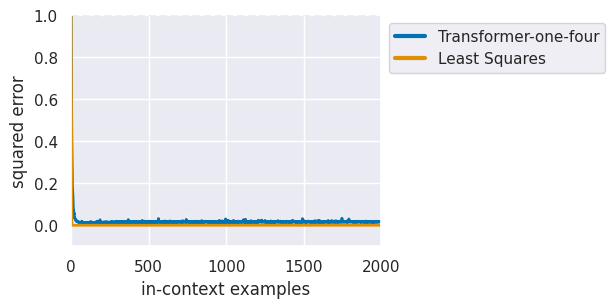

In [6]:
def valid_row(r):
    return r.task == task and r.run_id == run_id

metrics = collect_results(run_dir, df, valid_row=valid_row)
print(metrics)
_, conf = get_model_from_run(run_path, only_conf=True)
n_dims = conf.model.n_dims

models = relevant_model_names[task]
basic_plot(metrics["standard"], models=models)
plt.show()

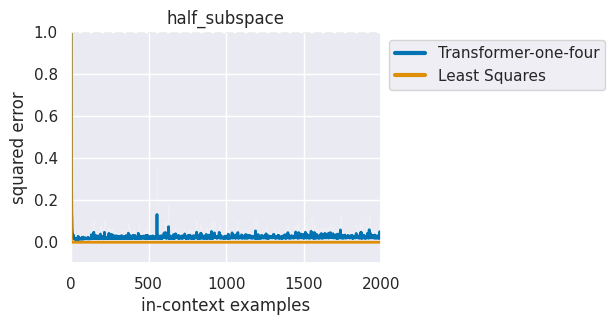

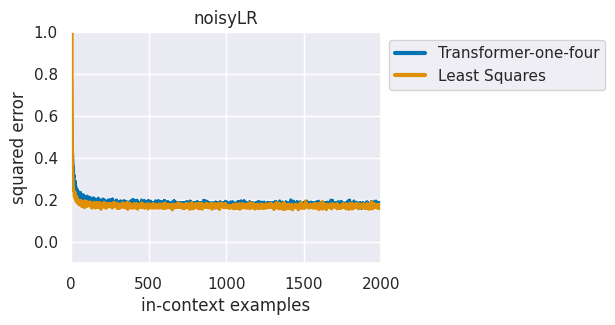

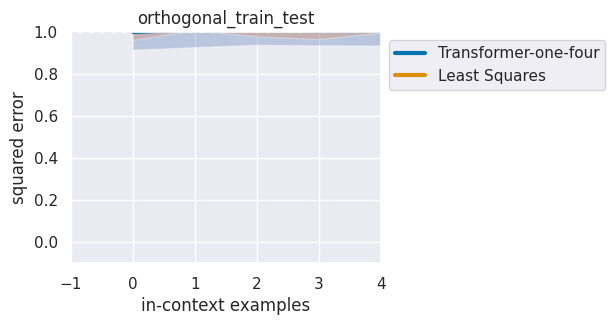

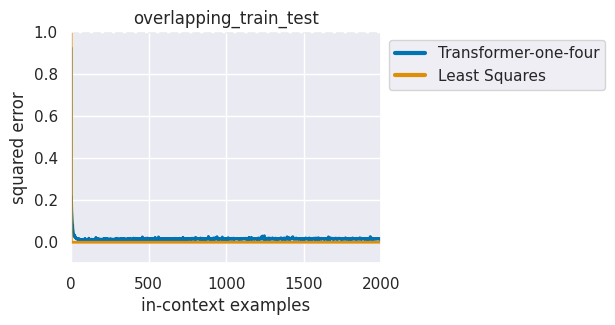

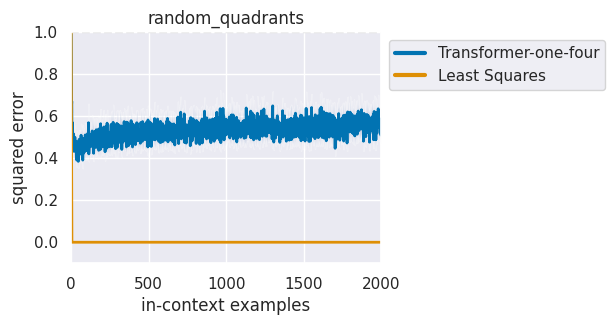

...

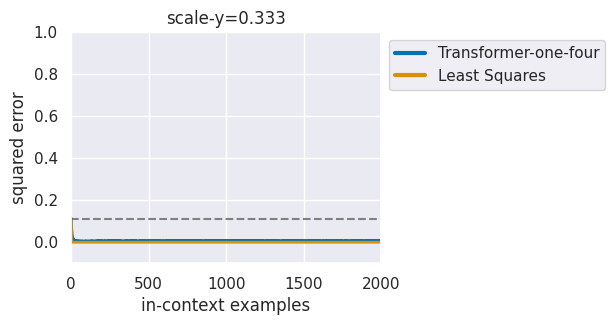

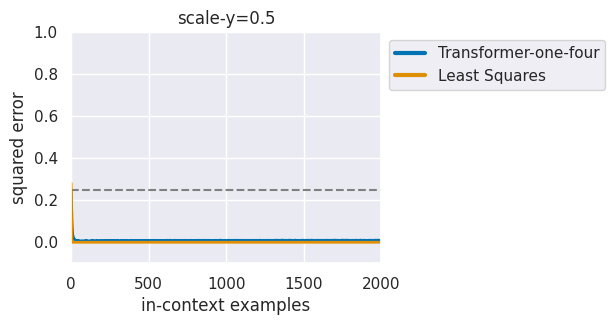

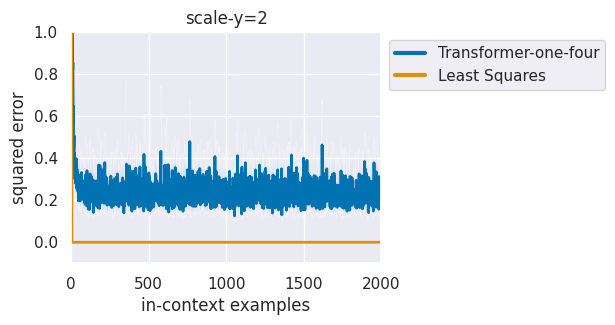

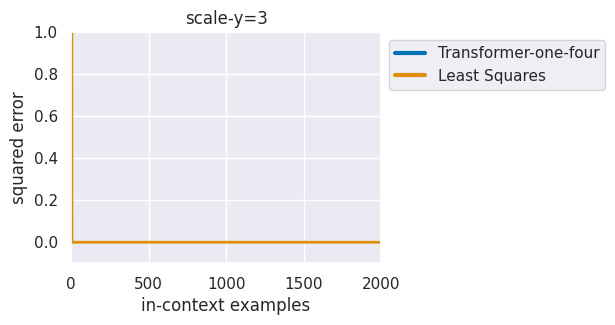

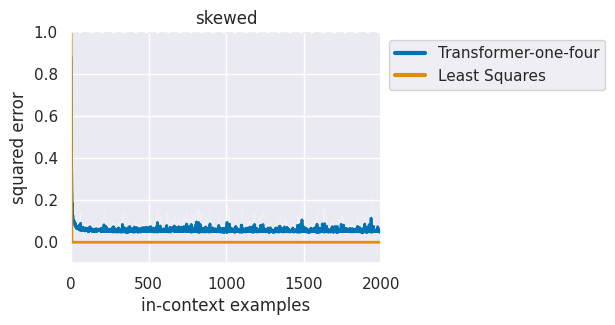

In [7]:
# plot any OOD metrics
for name, metric in metrics.items():
    if name == "standard": continue
   
    if "scale" in name:
        scale = float(name.split("=")[-1])**2
    else:
        scale = 1.0

    trivial = 1.0 if "noisy" not in name else (1+1/n_dims)
    fig, ax = basic_plot(metric, models=models, trivial=trivial * scale)
    ax.set_title(name)
    
    if "ortho" in name:
        ax.set_xlim(-1, n_dims - 1)
    # ax.set_ylim(-.1 * scale, 1.5 * scale)

    plt.show()

# Interactive setup

We will now directly load the model and measure its in-context learning ability on a batch of random inputs. (In the paper we average over multiple such batches to obtain better estimates.)

In [6]:
from samplers import get_data_sampler
from tasks import get_task_sampler

In [7]:
model, conf = get_model_from_run(run_path)

n_dims = conf.model.n_dims
batch_size = conf.training.batch_size

data_sampler = get_data_sampler(conf.training.data, n_dims)
task_sampler = get_task_sampler(
    conf.training.task,
    n_dims,
    batch_size,
    **conf.training.task_kwargs
)

In [8]:
task = task_sampler()
xs = data_sampler.sample_xs(b_size=batch_size, n_points=conf.training.curriculum.points.end)
ys = task.evaluate(xs)

In [9]:
with torch.no_grad():
    pred = model(xs, ys)

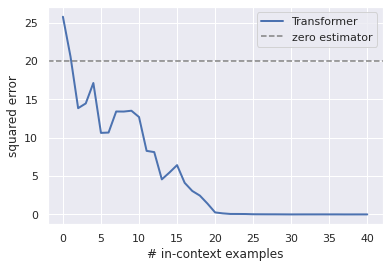

In [10]:
metric = task.get_metric()
loss = metric(pred, ys).numpy()

sparsity = conf.training.task_kwargs.sparsity if "sparsity" in conf.training.task_kwargs else None
baseline = {
    "linear_regression": n_dims,
    "sparse_linear_regression": sparsity,
    "relu_2nn_regression": n_dims,
    "decision_tree": 1,
}[conf.training.task]

plt.plot(loss.mean(axis=0), lw=2, label="Transformer")
plt.axhline(baseline, ls="--", color="gray", label="zero estimator")
plt.xlabel("# in-context examples")
plt.ylabel("squared error")
plt.legend()
plt.show()

As an exploration example, let's see how robust the model is to doubling all the inputs.

In [11]:
xs2 = 2 * xs
ys2 = task.evaluate(xs2)
with torch.no_grad():
    pred2 = model(xs2, ys2)

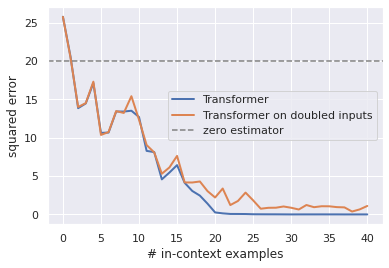

In [12]:
loss2 = metric(pred2, ys2).numpy()

plt.plot(loss.mean(axis=0), lw=2, label="Transformer")
plt.plot(loss2.mean(axis=0) / 4, lw=2, label="Transformer on doubled inputs")
plt.axhline(baseline, ls="--", color="gray", label="zero estimator")
plt.xlabel("# in-context examples")
plt.ylabel("squared error")
plt.legend()
plt.show()

The error does increase, especially when the number of in-context examples exceeds the dimension, but the model is still relatively accurate.